In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print("Libraries imported successfully!")

Libraries imported successfully!


In [2]:
df = pd.read_csv("water_potability.csv")
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
df.columns


Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [4]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

<Axes: >

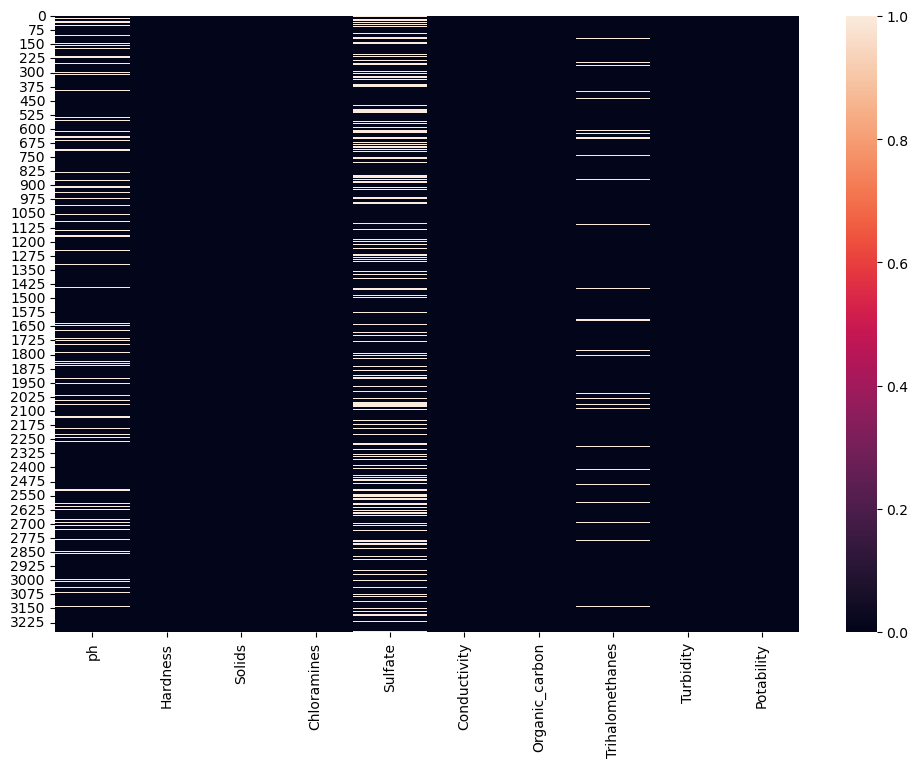

In [7]:
plt.figure(figsize=(12,8))
sns.heatmap(df.isnull())

<Axes: >

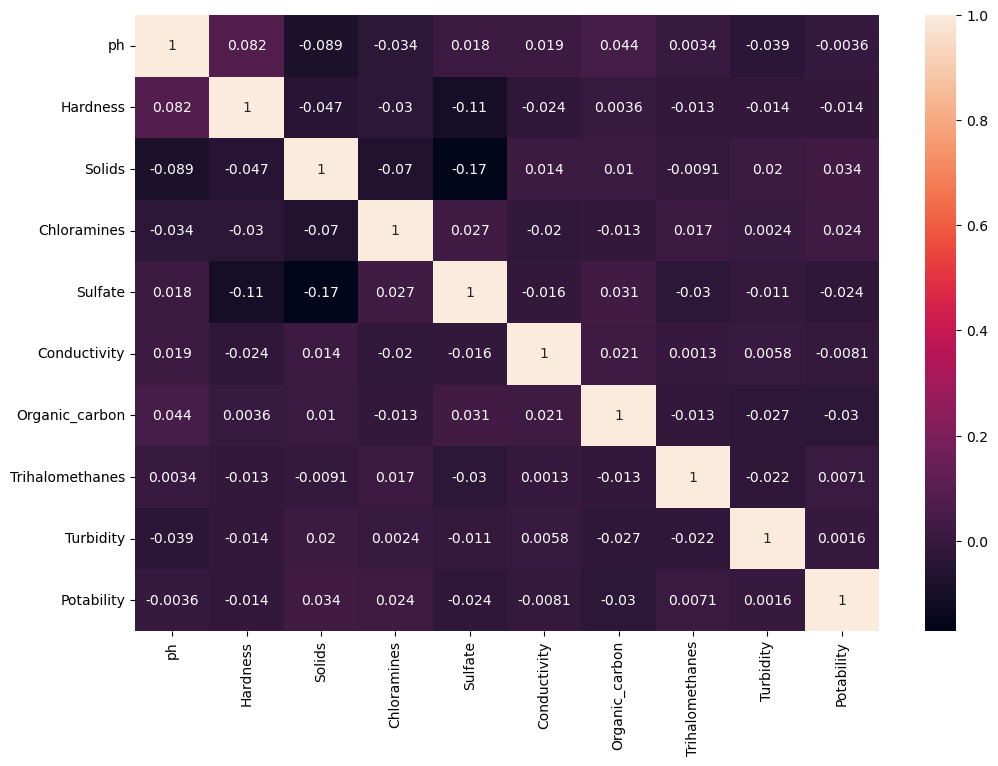

In [8]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(),annot=True)

<Axes: xlabel='Potability', ylabel='count'>

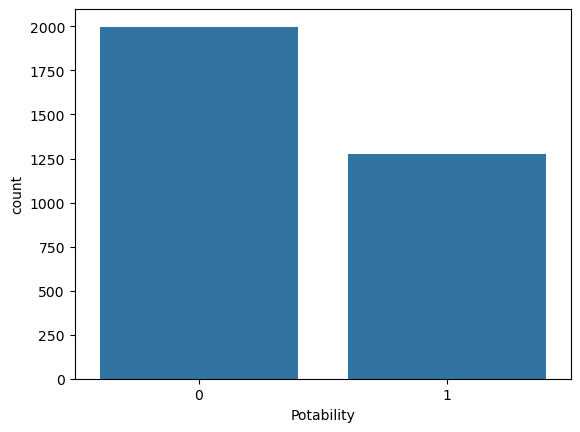

In [9]:
sns.countplot(x="Potability", data=df)

In [10]:
df["Potability"].value_counts()

Potability
0    1998
1    1278
Name: count, dtype: int64

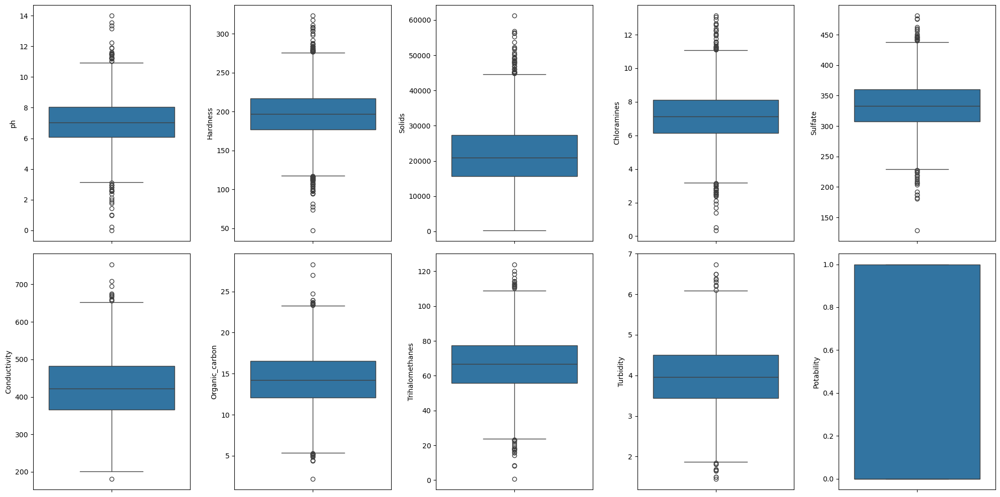

In [11]:
# Visulaization Dataset
# Assuming df is already loaded
fig, ax = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))
ax = ax.flatten()  # Flatten the 2D array of axes into a 1D array

# Ensure we do not exceed the number of available axes
num_cols = min(len(df.columns), len(ax))

for index, col in enumerate(df.columns[:num_cols]):  # Loop through column names
    sns.boxplot(y=col, data=df, ax=ax[index])

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

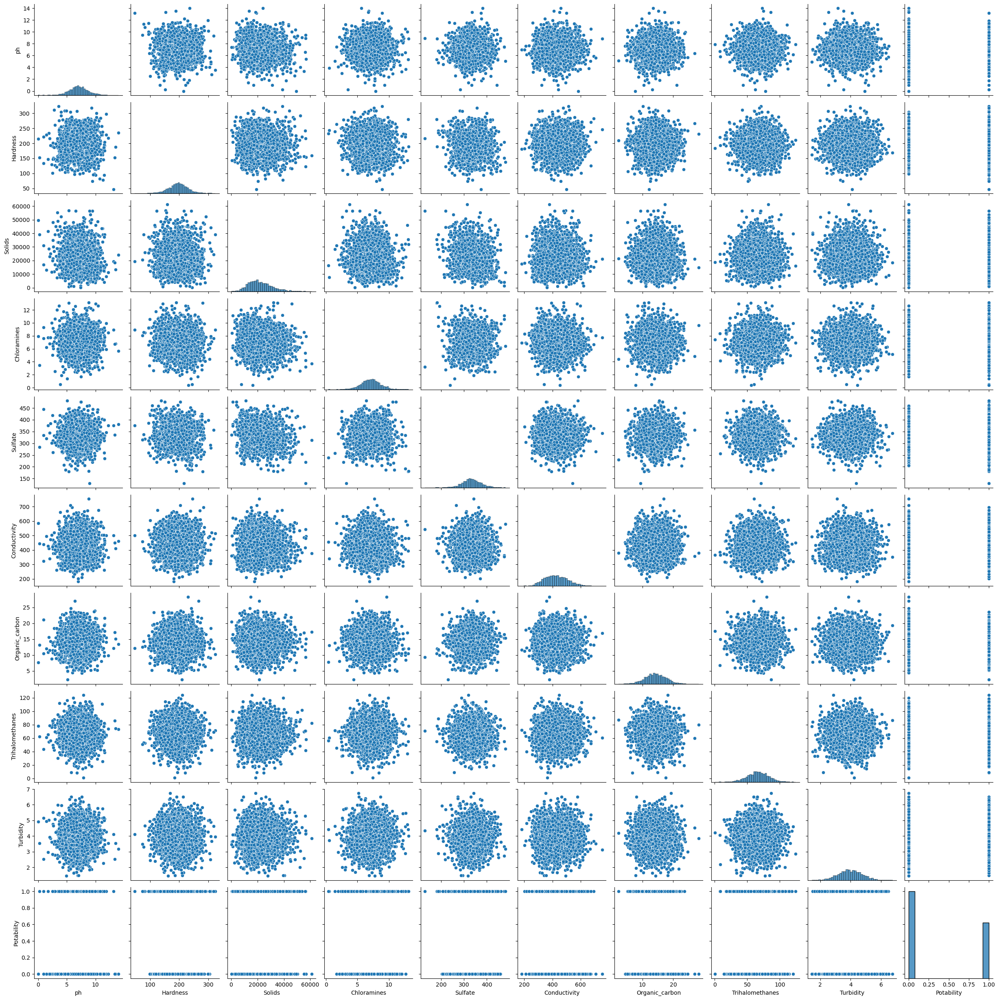

In [12]:
sns.pairplot(df)

In [13]:
fig = px.pie(df,names = "Potability",hole = 0.4)
fig.show()

In [14]:
fig = px.scatter(df,x ="ph", y="Sulfate",template="plotly_dark",color="Potability")
fig.update_layout(title="Scatter Plot of pH vs Sulfate")
fig.show()

In [15]:
fig = px.scatter(df,x ="Organic_carbon", y="Hardness",template="plotly_dark",color="Potability")
fig.update_layout(title="Scatter Plot of Organic Carbon vs Hardness")
fig.show()

In [16]:
import plotly.express as px

fig = px.scatter(df, x="Solids", y="Trihalomethanes", template="plotly_dark", color="Potability")
fig.update_layout(title="Scatter Plot of Solids vs Trihalomethanes")
fig.show()


In [17]:
import plotly.express as px

fig = px.scatter(df, x="Chloramines", y="Turbidity", template="plotly_dark", color="Potability")
fig.update_layout(title="Scatter Plot of Chloramines vs Turbidity")
fig.show()


In [18]:
# import plotly.express as px
# import itertools

# # List of all features in the dataset
# features = ["ph", "Hardness", "Solids", "Chloramines", "Sulfate", 
#             "Conductivity", "Organic_carbon", "Trihalomethanes", 
#             "Turbidity", "Potability"]

# # Generate all possible unique feature pairs for scatter plots
# feature_pairs = list(itertools.combinations(features, 2))

# # Create scatter plots for each feature pair
# for x_feature, y_feature in feature_pairs:
#     fig = px.scatter(df, x=x_feature, y=y_feature, template="plotly_dark", color="Potability")
#     fig.update_layout(title=f"Scatter Plot of {x_feature} vs {y_feature}")
#     fig.show()

Text(0, 0.5, 'Percentage of missing values')

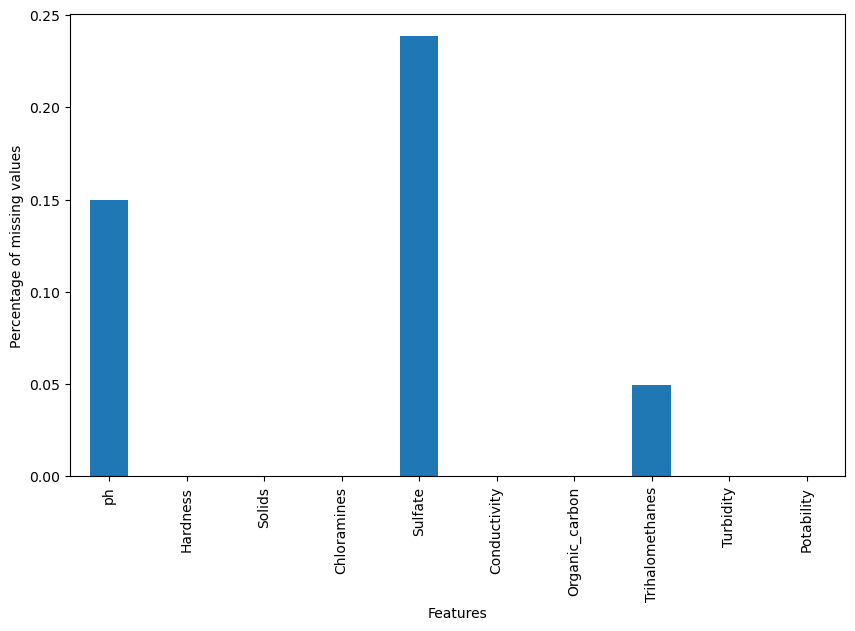

In [19]:
df.isnull().mean().plot.bar(figsize = (10,6))
plt.xlabel("Features")
plt.ylabel("Percentage of missing values")

In [20]:
df["ph"] = df["ph"].fillna(df["ph"].mean())
df["Sulfate"] = df["Sulfate"].fillna(df["Sulfate"].mean())
df["Trihalomethanes"] = df["Trihalomethanes"].fillna(df["Trihalomethanes"].mean())

In [21]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

<Axes: >

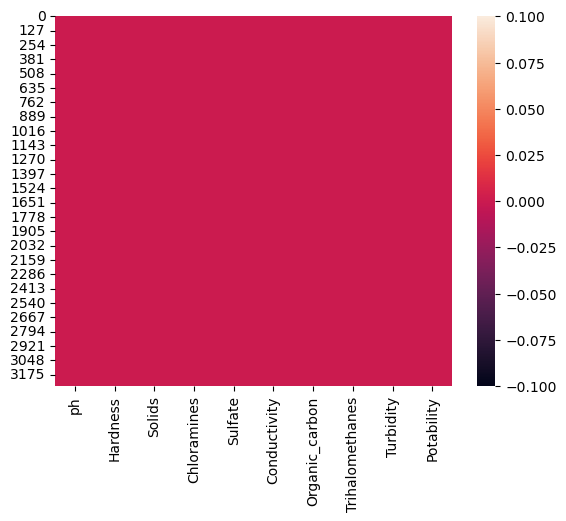

In [22]:
sns.heatmap(df.isnull())

In [23]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [24]:
x = df.drop("Potability",axis=1)
y = df["Potability"]

In [25]:
x.shape , y.shape

((3276, 9), (3276,))

In [26]:
scaler = StandardScaler()
x = scaler.fit_transform(x)
x

array([[-6.04313345e-16,  2.59194711e-01, -1.39470871e-01, ...,
        -1.18065057e+00,  1.30614943e+00, -1.28629758e+00],
       [-2.28933938e+00, -2.03641367e+00, -3.85986650e-01, ...,
         2.70597240e-01, -6.38479983e-01,  6.84217891e-01],
       [ 6.92867789e-01,  8.47664833e-01, -2.40047337e-01, ...,
         7.81116857e-01,  1.50940884e-03, -1.16736546e+00],
       ...,
       [ 1.59125368e+00, -6.26829230e-01,  1.27080989e+00, ...,
        -9.81329234e-01,  2.18748247e-01, -8.56006782e-01],
       [-1.32951593e+00,  1.04135450e+00, -1.14405809e+00, ...,
        -9.42063817e-01,  7.03468419e-01,  9.50797383e-01],
       [ 5.40150905e-01, -3.85462310e-02, -5.25811937e-01, ...,
         5.60940070e-01,  7.80223466e-01, -2.12445866e+00]])

In [27]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2)

In [28]:
x_train.shape, x_test.shape

((2620, 9), (656, 9))

In [29]:
y_train.shape, y_test.shape

((2620,), (656,))

Logistic Regression

In [30]:
from sklearn.linear_model import LogisticRegression
#object of LR
model_lr = LogisticRegression()

In [31]:
#Training Model
model_lr.fit(x_train,y_train)

LogisticRegression()

In [32]:
#Making Prediction
pred_lr = model_lr.predict(x_test)
pred_lr

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [33]:
# Accuracy Score
accuracy_score_lr = accuracy_score(y_test,pred_lr)
accuracy_score_lr

0.5960365853658537

In [34]:
#confusion Matrix
cm1 = confusion_matrix(y_test,pred_lr)
cm1

array([[391,   0],
       [265,   0]])

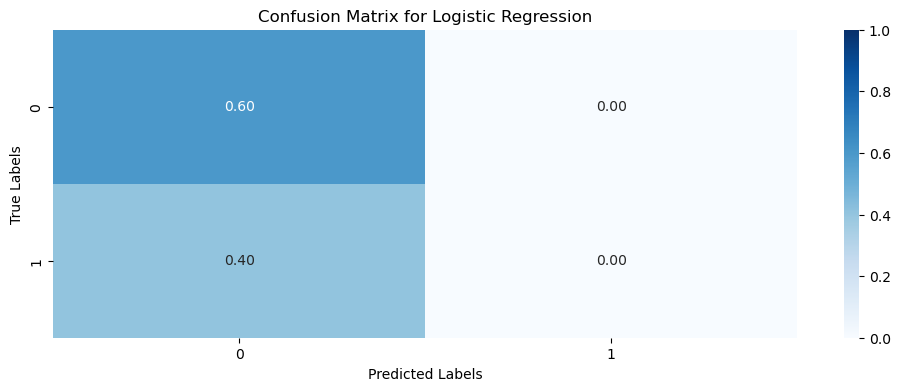

In [35]:
plt.figure(figsize=(12, 4))
sns.heatmap(cm1 / np.sum(cm1), annot=True, fmt=".2f", cmap="Blues", vmin=0, vmax=1)
plt.title("Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Decision Tree Classifier

In [36]:
from sklearn.tree import DecisionTreeClassifier

##object of DT
model_dt = DecisionTreeClassifier(max_depth = 4)

In [37]:
#Training Model
model_dt.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=4)

In [38]:
#Making Prediction
pred_dt = model_dt.predict(x_test)
pred_dt

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [39]:
# Accuracy Score
accuracy_score_dt = accuracy_score(y_test,pred_dt)
accuracy_score_dt

0.6417682926829268

In [40]:
#confusion Matrix
cm2 = confusion_matrix(y_test,pred_dt)
cm2

array([[355,  36],
       [199,  66]])

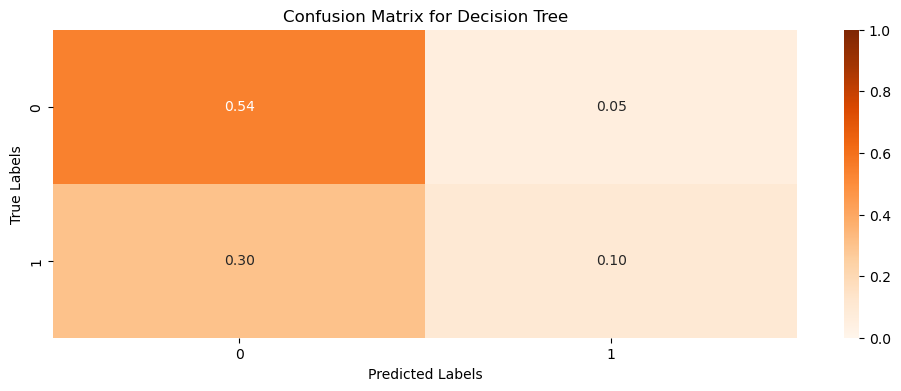

In [41]:
# Confusion Matrix 
plt.figure(figsize=(12, 4))
sns.heatmap(cm2 / np.sum(cm2), annot=True, fmt=".2f", cmap="Oranges", vmin=0, vmax=1)
plt.title("Confusion Matrix for Decision Tree")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Random Forest Classifier

In [42]:
from sklearn.ensemble import RandomForestClassifier

##object of RF
model_rf = RandomForestClassifier()

In [43]:
#Training Model
model_rf.fit(x_train,y_train)

RandomForestClassifier()

In [44]:
#Making Prediction
pred_rf = model_rf.predict(x_test)
pred_rf

array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,

In [45]:
# Accuracy Score
accuracy_score_rf = accuracy_score(y_test,pred_rf)
accuracy_score_rf

0.6402439024390244

In [46]:
#confusion Matrix
cm3= confusion_matrix(y_test,pred_rf)
cm3

array([[335,  56],
       [180,  85]])

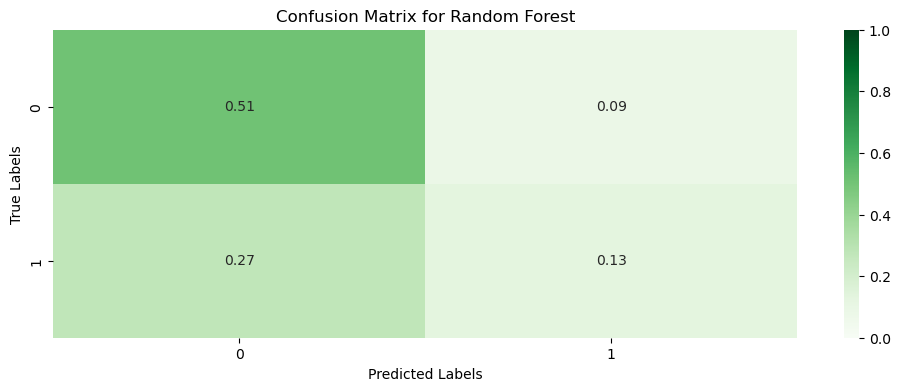

In [47]:
# Confusion Matrix 
plt.figure(figsize=(12, 4))
sns.heatmap(cm3 / np.sum(cm3), annot=True, fmt=".2f", cmap="Greens", vmin=0, vmax=1)
plt.title("Confusion Matrix for Random Forest")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

KNN --- K-Nearest Neighbors

In [48]:
from sklearn.neighbors import KNeighborsClassifier

##object of KNN
for i in range(4,30):
    model_knn = KNeighborsClassifier(n_neighbors=i)
    model_knn.fit(x_train,y_train)
    pred_knn = model_knn.predict(x_test)
    accuracy_score_knn = accuracy_score(y_test,pred_knn)
    print(i,accuracy_score_knn)

4 0.6219512195121951
5 0.614329268292683
6 0.6295731707317073
7 0.6067073170731707
8 0.6158536585365854
9 0.6051829268292683
10 0.6158536585365854
11 0.6158536585365854
12 0.6173780487804879
13 0.6173780487804879
14 0.6173780487804879
15 0.6234756097560976
16 0.6189024390243902
17 0.614329268292683
18 0.6219512195121951
19 0.6265243902439024
20 0.6234756097560976
21 0.6295731707317073
22 0.6234756097560976
23 0.6265243902439024
24 0.6219512195121951
25 0.6295731707317073
26 0.6280487804878049
27 0.6310975609756098
28 0.6310975609756098
29 0.6234756097560976


In [49]:
model_knn = KNeighborsClassifier(n_neighbors=17)

In [50]:
#Training Model
model_knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=17)

In [51]:
#Making Prediction
pred_knn = model_knn.predict(x_test)
pred_knn

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [52]:
# Accuracy Score
accuracy_score_knn = accuracy_score(y_test,pred_knn)
accuracy_score_knn

0.614329268292683

In [53]:
#confusion Matrix
cm4= confusion_matrix(y_test,pred_knn)
cm4

array([[345,  46],
       [207,  58]])

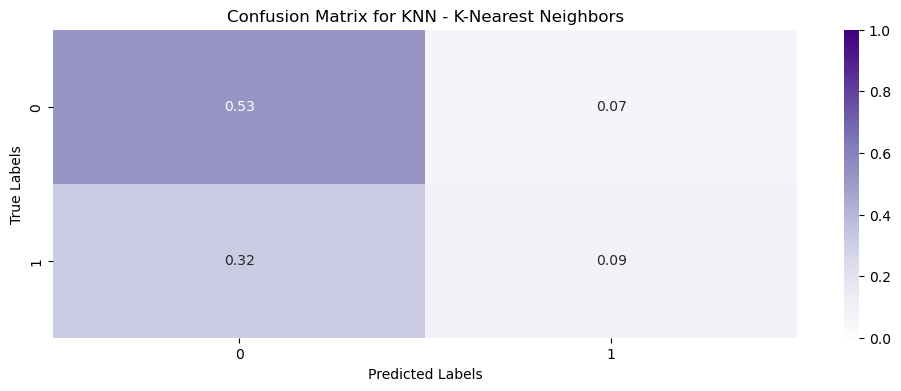

In [54]:
plt.figure(figsize=(12, 4))
sns.heatmap(cm4 / np.sum(cm4), annot=True, fmt=".2f", cmap="Purples", vmin=0, vmax=1)
plt.title("Confusion Matrix for KNN - K-Nearest Neighbors")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Support Vector Machine(SVM)

In [55]:
from sklearn.svm import SVC

##object of SVM
model_svm = SVC(kernel="rbf")

In [56]:
#Training Model
model_svm.fit(x_train,y_train)

SVC()

In [57]:
#Making Prediction
pred_svm = model_svm.predict(x_test)
pred_svm

array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,

In [58]:
# Accuracy Score
accuracy_score_svm = accuracy_score(y_test,pred_svm)
accuracy_score_svm

0.6707317073170732

In [59]:
#confusion Matrix
cm5= confusion_matrix(y_test,pred_svm)
cm5

array([[356,  35],
       [181,  84]])

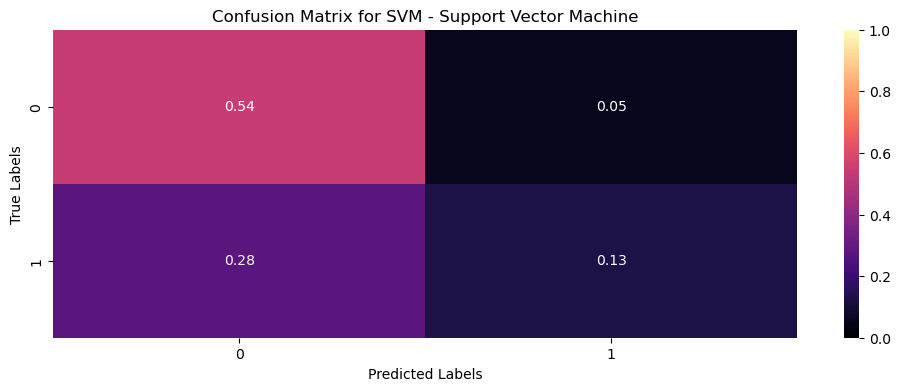

In [60]:
plt.figure(figsize=(12, 4))
sns.heatmap(cm5 / np.sum(cm5), annot=True, fmt=".2f", cmap="magma", vmin=0, vmax=1)
plt.title("Confusion Matrix for SVM - Support Vector Machine")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

AdaBoost Classifiers

In [61]:
from sklearn.ensemble import AdaBoostClassifier

##object of ADA
model_ada = AdaBoostClassifier(n_estimators=200,learning_rate=0.05)

In [62]:
#Training Model
model_ada.fit(x_train,y_train)

AdaBoostClassifier(learning_rate=0.05, n_estimators=200)

In [63]:
#Making Prediction
pred_ada = model_ada.predict(x_test)
pred_ada

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [64]:
# Accuracy Score
accuracy_score_ada = accuracy_score(y_test,pred_ada)
accuracy_score_ada

0.5975609756097561

In [65]:
#confusion Matrix
cm6= confusion_matrix(y_test,pred_ada)
cm6

array([[381,  10],
       [254,  11]])

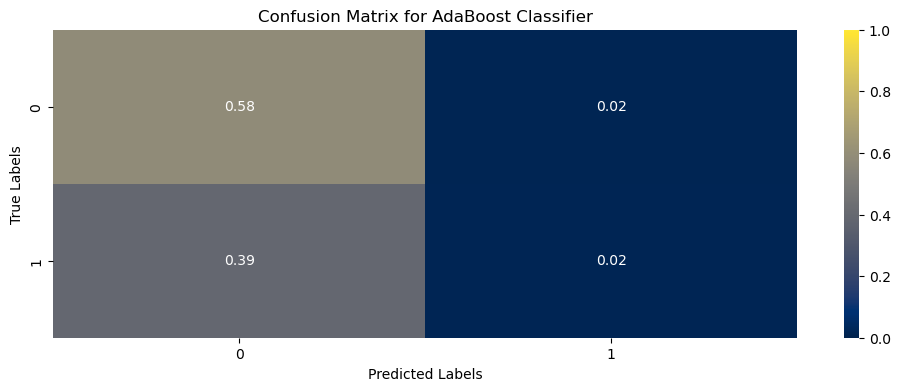

In [66]:
plt.figure(figsize=(12, 4))
sns.heatmap(cm6 / np.sum(cm6), annot=True, fmt=".2f", cmap="cividis", vmin=0, vmax=1)
plt.title("Confusion Matrix for AdaBoost Classifier")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

XGBoosT

In [67]:
from xgboost import XGBClassifier

##object of XGB
model_xgb = XGBClassifier(n_estimators=200,learning_rate=0.03)

In [68]:
#Training Model
model_xgb.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [69]:
#Making Prediction
pred_xgb = model_xgb.predict(x_test)
pred_xgb

array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,

In [70]:
# Accuracy Score
accuracy_score_xgb = accuracy_score(y_test,pred_xgb)
accuracy_score_xgb

0.6676829268292683

In [71]:
#confusion Matrix
cm7= confusion_matrix(y_test,pred_xgb)
cm7

array([[347,  44],
       [174,  91]])

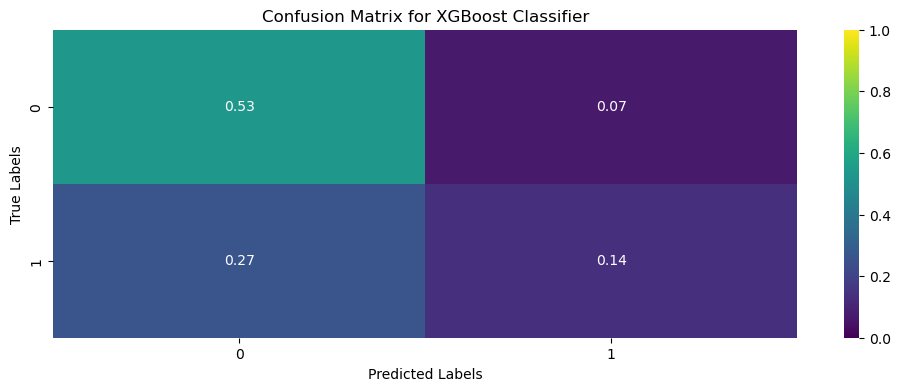

In [72]:
plt.figure(figsize=(12, 4))
sns.heatmap(cm7 / np.sum(cm7), annot=True, fmt=".2f", cmap="viridis", vmin=0, vmax=1)
plt.title("Confusion Matrix for XGBoost Classifier")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


In [73]:
models = pd.DataFrame({
    "Models": ["Logistic Regression",
              "Decision Tree",
              "Random Forest",
              "KNN",
              "SVM",
              "AdaBoost",
              "XGBoost"],  
    "Accuracy Score": [accuracy_score_lr, accuracy_score_dt, accuracy_score_rf,
                       accuracy_score_knn, accuracy_score_svm, accuracy_score_ada,
                       accuracy_score_xgb]
})

In [74]:
models

,Models,Accuracy Score
0,Logistic Regression,0.596037
1,Decision Tree,0.641768
2,Random Forest,0.640244
3,KNN,0.614329
4,SVM,0.670732
5,AdaBoost,0.597561
6,XGBoost,0.667683


In [75]:
models_sorted = models.sort_values(by="Accuracy Score",ascending=False)
models_sorted

,Models,Accuracy Score
4,SVM,0.670732
6,XGBoost,0.667683
1,Decision Tree,0.641768
2,Random Forest,0.640244
3,KNN,0.614329
5,AdaBoost,0.597561
0,Logistic Regression,0.596037


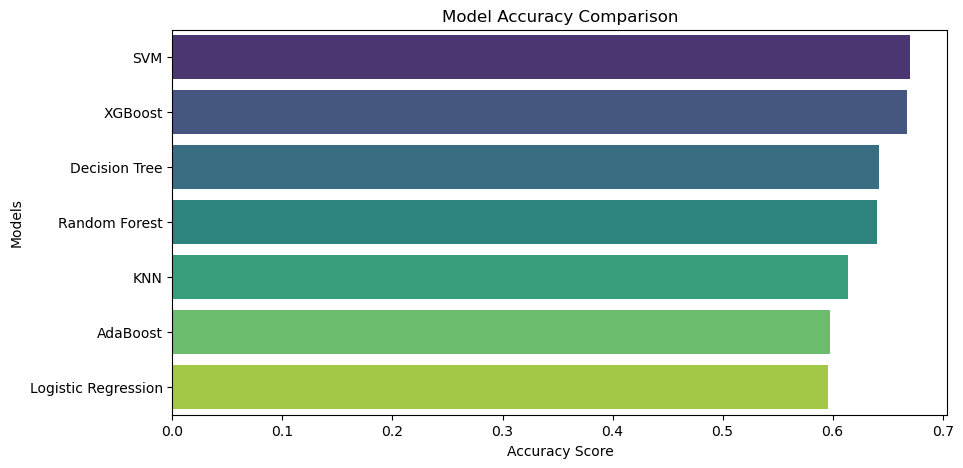

In [76]:
# Plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x="Accuracy Score", y="Models", data=models_sorted, hue="Models", legend=False, palette="viridis")

# Add labels
plt.title("Model Accuracy Comparison")
plt.xlabel("Accuracy Score")
plt.ylabel("Models")

# Show the plot
plt.show()

Accuracy Score: 0.70625
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.71      0.70       394
           1       0.71      0.71      0.71       406

    accuracy                           0.71       800
   macro avg       0.71      0.71      0.71       800
weighted avg       0.71      0.71      0.71       800

Confusion Matrix:
 [[278 116]
 [119 287]]
Feature Importance:
            Feature  Importance
4          Sulfate    0.134487
0               ph    0.133871
3      Chloramines    0.122310
1         Hardness    0.115390
2           Solids    0.113077
5     Conductivity    0.098315
7  Trihalomethanes    0.095723
6   Organic_carbon    0.094454
8        Turbidity    0.092373


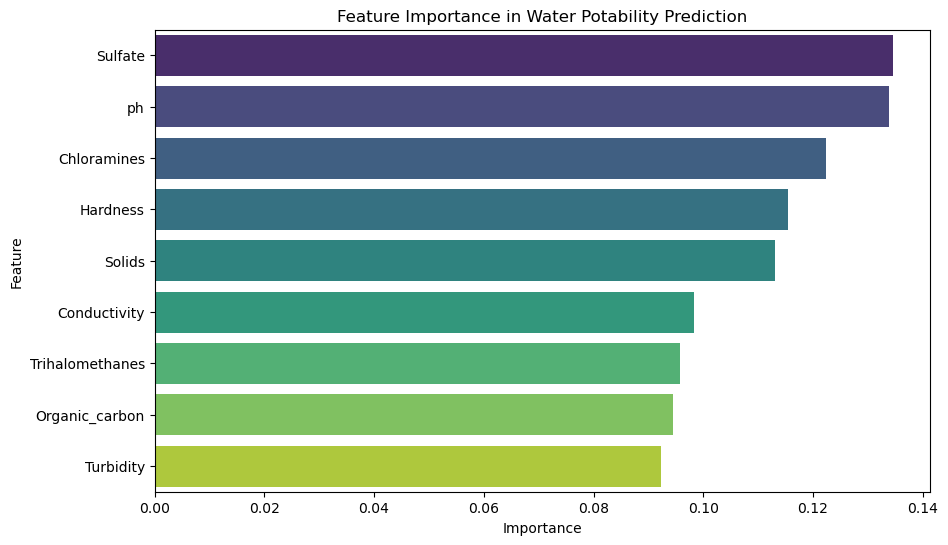

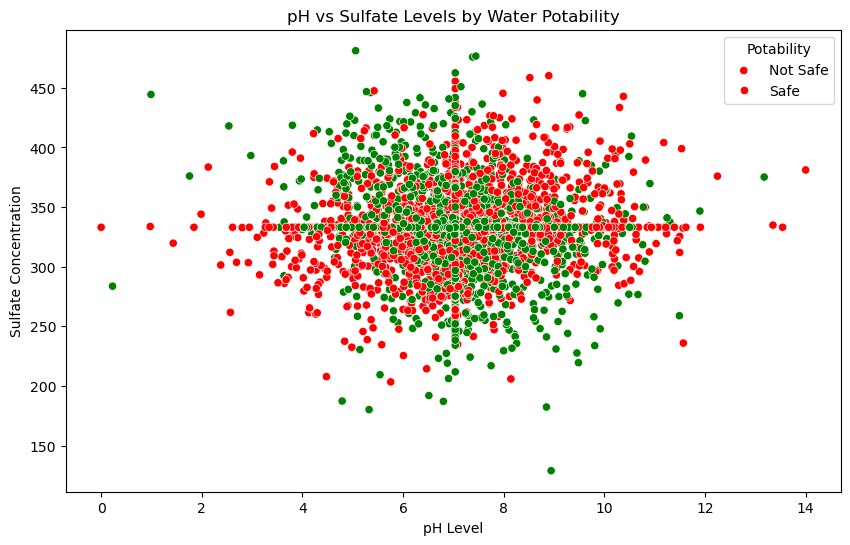

Test Sample Prediction: ❌ Not Safe for Drinking: Contains high levels of contaminants. Needs purification before use.


In [77]:
from imblearn.over_sampling import SMOTE
import warnings
from sklearn.utils.validation import validate_data

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load dataset
df = pd.read_csv("water_potability.csv")

# Handling missing values (filling with median values)
df.fillna(df.median(), inplace=True)

# Splitting data into features and target variable
X = df.drop("Potability", axis=1)
y = df["Potability"]

# Handling class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert X_test back to DataFrame to maintain feature names
X_test_df = pd.DataFrame(X_test, columns=X.columns)

# Train an XGBoost model for better accuracy
model = XGBClassifier(n_estimators=300, learning_rate=0.05, max_depth=10, random_state=42)
model.fit(X_train, y_train)

# Function to predict if water is drinkable with explanation
def predict_water_quality(features):
    features = pd.DataFrame([features], columns=X.columns)  # Convert to DataFrame with column names
    features = scaler.transform(features)  # Transform correctly
    prediction = model.predict(features)[0]
    
    return "✅ Safe for Drinking: Meets potability standards with low contamination levels." if prediction == 1 else "❌ Not Safe for Drinking: Contains high levels of contaminants. Needs purification before use."

# Evaluate model performance
y_pred = model.predict(X_test)
print("Accuracy Score:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Check feature importance
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print("Feature Importance:\n", feature_importance_df)

# Plot feature importance
plt.figure(figsize=(10,6))
sns.barplot(x=feature_importance_df["Importance"], y=feature_importance_df["Feature"], palette="viridis")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance in Water Potability Prediction")
plt.show()

# Scatter plot for pH vs Sulfate with potability
plt.figure(figsize=(10,6))
sns.scatterplot(x=df["ph"], y=df["Sulfate"], hue=df["Potability"], palette={0:"red", 1:"green"})
plt.xlabel("pH Level")
plt.ylabel("Sulfate Concentration")
plt.title("pH vs Sulfate Levels by Water Potability")
plt.legend(title="Potability", labels=["Not Safe", "Safe"])
plt.show()

# Making a single prediction example
sample_test = X_test_df.iloc[0]  # Selecting the first test sample with correct format
print(f"Test Sample Prediction: {predict_water_quality(sample_test)}")